# Table of Content

1. ## [Data Loading](#data-loading)
2. ## [Batch Analysis](#batch-analysis)
    1. ### [Direct Analysis](#direct-analysis)
    1. ### [Single Group-by Column Analysis](#single-groupby-analysis)
    2. ### [Double Group-by Column Analysis](#double-groupby-analysis)
3. ## [Word Cloud](#word-cloud)
4. ## [Validation](#validation)
5. ## [Feature Importance/Coefficience](#Features)
    1. ### [Xgboost](#xgboost)
    2. ### [Linear Regression](#Linear-Regression)

In [1]:
import pickle
import pandas as pd
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import os
import random
import geopandas
from datetime import *
from collections import namedtuple
import scipy as sp
from scipy.stats import mstats
import jieba
import jieba.posseg
from wordcloud import WordCloud, STOPWORDS
from gensim.models import CoherenceModel
from gensim import corpora, models, similarities
import gensim
from wordcloud import WordCloud, ImageColorGenerator
from random import choice
import re
from functools import *

<a name="data-loading"/>

# Data Loading

## Post Data Loading

In [2]:
with open('df/final_post_no_content_.pkl','rb') as f:
    post_df = pickle.load(f)
    test_post_df = post_df.sample(10)
post_df.head()

,user_id,general_device,repost_timestamp_month,post_timestamp_month,post_censored,gender,#tweets,#follower,#following,verification,#censored_posts,#collected_posts,#follower_percentile_grouped,province,province_gdp,censored,censored_ratio,censored_ratio_percentile
0,6195560523,Apple,2021-08,2021-08,False,f,138,7,521,False,0,59,3,其他,0,False,0.0,0
1,6195560523,Apple,2021-08,2021-08,False,f,138,7,521,False,0,59,3,其他,0,False,0.0,0
2,6195560523,Apple,2021-08,2021-07,False,f,138,7,521,False,0,59,3,其他,0,False,0.0,0
3,6195560523,Apple,2021-08,2021-07,False,f,138,7,521,False,0,59,3,其他,0,False,0.0,0
4,6195560523,Apple,2021-07,2021-07,False,f,138,7,521,False,0,59,3,其他,0,False,0.0,0


## User Data Loading 

In [3]:
with open('df/user_df.pkl', 'rb') as f:
    users_with_content = pickle.load(f)
users_with_content.head()

,id,gender,#tweets,#follower,#following,verification,#censored_posts,#collected_posts,#follower_percentile_grouped,province,province_gdp,censored,censored_ratio,censored_ratio_percentile
536321,2453175617,f,2,0,172,False,0,1,1,其他,0,False,0.0,0
278927,2123046974,f,8,0,18,False,0,3,1,其他,0,False,0.0,0
151815,2045211094,m,15,0,48,False,0,4,1,河南,8302,False,0.0,0
102659,2364128741,m,55,0,420,False,0,25,1,河南,8302,False,0.0,0
366639,1338220431,m,40,0,221,False,0,26,1,其他,0,False,0.0,0


## Map Data Loading

In [14]:
province_translations = {
    "安徽":"Anhui",
    "福建":"Fujian",
    "甘肃":"Gansu",
    "广东":"Guangdong",
    "贵州":"Guizhou",
    "海南":"Hainan",
    "河北":"Hebei",
    "黑龙江":"Heilongjiang",
    "河南":"Henan",
    "湖北":"Hubei",
    "湖南":"Hunan",
    "江苏":"Jiangsu",
    "江西":"Jiangxi",
    "吉林":"Jilin",
    "辽宁":"Liaoning",
    "青海":"Qinghai",
    "陕西":"Shaanxi",
    "山东":"Shandong",
    "山西":"Shanxi",
    "四川":"Sichuan",
    "云南":"Yunnan",
    "浙江":"Zhejiang",
    "北京":"Beijing",
    "重庆":"Chongqing",
    "上海":"Shanghai",
    "天津":"Tianjin",
    "广西":"Guangxi",
    "内蒙古":"Inner Mongolia",
    "宁夏":"Ningxia",
    "新疆":"Xinjiang",
    "西藏":"Tibet",
    "香港":"Hong Kong",
    "澳门":"Macau",
    "台湾":"Taiwan",
    "海外":"Overseas",
    "其他":"Other",
}

In [15]:
china_geo_df = geopandas.read_file('china.json')
china_geo_df['name'] = china_geo_df['name'].map(lambda x : province_translations[x])
china_geo_df.head()

,id,size,name,childNum,geometry
0,65,550,Xinjiang,18,"POLYGON ((96.41600 42.75880, 96.41600 42.71480..."
1,54,550,Tibet,7,"POLYGON ((79.01370 34.32130, 79.10160 34.45310..."
2,15,450,Inner Mongolia,12,"POLYGON ((97.20700 42.80270, 99.49220 42.58300..."
3,63,800,Qinghai,8,"POLYGON ((89.73630 36.07910, 89.91210 36.07910..."
4,51,900,Sichuan,21,"POLYGON ((101.77730 33.53030, 101.86520 33.574..."


<a name="batch-analysis"/>

# Batch Analysis

In [16]:
AnalysisFunc = namedtuple(
    'AnalysisFunc', 
    ["analyze_func", "columns_selector", "chart_analysis_name","override_chart_type", "applicable_dfs", "err_bar_func"],
    defaults = [None, {"User", "Post"}, None]
)

Column = namedtuple(
    'Column',
    ["col_name", "chart_name", "chart_type", "chart_args", "post_process_mapping", "applicable_dfs"],
    defaults = [None, None, {"User", "Post"}]
)

In [18]:
from scipy.stats import t

def get_confidence_interval_for_mean(s):
    # t confidence interval
    err = t.ppf(0.99, s.count()-1) * s.std() / s.count()**0.5
    return err

#get_confidence_interval_for_mean(pd.DataFrame([1,2,3,3,4,5,5,5,5,5]))

In [19]:
metrics = [
    AnalysisFunc(
        'mean',
        lambda df: df['post_censored'] if 'post_censored' in df.columns else df['censored'], 
        "Censored {} Ratio",
        err_bar_func = get_confidence_interval_for_mean
    ),
    AnalysisFunc(
        'count', 
        lambda df: df['gender'], 
        "{} Count"
    ),
    AnalysisFunc(
        "sum",
        lambda df: df['post_censored'] if 'post_censored' in df.columns else df['censored'], 
        "Censored {} Count"
    ),
    AnalysisFunc(
        "mean",
        lambda df: df['censored_ratio'], # = #censored_repost / #repost
        "Average Percentage of Reposting Censored Content",
        applicable_dfs = {'User'},
        err_bar_func = get_confidence_interval_for_mean
    )
]

In [20]:
columns = [
    Column(
        "gender", 
        "Gender", 
        "bar", 
        chart_args={"rot":0,"xlabel":"Gender", 'color':(0.0,0.0,0.9)}, 
        post_process_mapping={"f":"Female", "m":"Male"}
    ),
    Column(
        "gender", 
        "Gender", 
        "pie", 
        post_process_mapping={"f":"Female", "m":"Male"},
        applicable_dfs = {"User"}
    ),
    Column(
        "verification", 
        "Verification Status", 
        "bar",
        chart_args = {"rot":0, 'color':(0.0,0.9,0.0)},
        post_process_mapping={True: "Verified", False: "Unverified"}
    ),
    Column(
        "verification", 
        "Verification Status", 
        "pie",
        post_process_mapping={True: "Verified", False: "Unverified"},
        applicable_dfs = {"User"}
    ),
    Column(
        "province", 
        "Province",
        "map",
        post_process_mapping=province_translations
    ),
    Column(
        "#follower_percentile_grouped", 
        "Follower Count Percentile", 
        "bar",
        chart_args = {"xlabel":"Quantile of Number of Followers(Scaled by 10)","rot":0, 'color':(0.0,0.9,0.9)}
    ),
    Column(
        "general_device",
        "Device",
        "bar",
        chart_args = {"rot":60,"xlabel":"Device", 'color':(0.9,0.0,0.0)},
        applicable_dfs = {"Post"}
    )
]

In [21]:
all_dfs = {
    "User": users_with_content,
    "Post": post_df,
}

In [22]:
#users_with_content['censored_ratio'].std()
#sp.stats.norm.interval(0.68, loc=10, scale=1)

In [31]:
def plot(out_df, chart_type, **kwargs):
    value_column = out_df.columns[0]
    title = kwargs['title']
    
    if chart_type == "bar":
        kwargs.setdefault('color',(random.random(),random.random(),random.random()))
        kwargs.setdefault('figsize', (9,6))
        ax = out_df.plot.bar(**kwargs)
        
    elif chart_type == "map":
        count_map = china_geo_df.merge(out_df, left_on='name', right_on=out_df.columns[0],right_index=True)
        kwargs.setdefault('figsize', (9,6))
        kwargs.setdefault('legend', True)
        kwargs.setdefault('legend_kwds',{'label': kwargs['title'],'shrink': 0.6})
        kwargs.pop('title')
        kwargs.pop('yerr',None)
        kwargs.pop('capsize', None)
        ax = count_map.plot(column=value_column, **kwargs)
        ax.axis("off")
        ax.set_title(title)
        
    elif chart_type == "pie":
        # default values
        kwargs.setdefault('figsize', (9,6))
        kwargs.setdefault('shadow',True)
        kwargs.setdefault('startangle', 90)
        kwargs.setdefault('autopct','%1.1f%%')
        kwargs.setdefault('labeldistance', 1.05)
        kwargs.setdefault('normalize', True)
        kwargs.pop('color',None)
        kwargs.pop('yerr', None)
        kwargs.pop('capsize', None)
        ax = out_df.plot.pie(y=value_column, **kwargs)
    
    output_filename = f'{title.lower().replace(" ", "_")}_{chart_type}_chart.png'
    
    ax.get_figure().savefig(f'figures2/{output_filename}')

<a name="direct-analysis" />

### Direct Analysis

In [24]:
def analyze_whole_df(df, analysis,df_title):
    analysis_w_table_name = analysis.chart_analysis_name.format(df_title)
    output = pd.DataFrame({
        analysis_w_table_name: analysis.columns_selector(df)
    }).agg(analysis.analyze_func)
    print(f"{analysis_w_table_name} = {output[0]}")

# analyze_whole_df(users_with_content, metrics[1], "User")

In [25]:
for analysis in metrics:
    for df_title, df in all_dfs.items():
        if df_title in analysis.applicable_dfs:
            analyze_whole_df(df, analysis, df_title)

Censored User Ratio = 0.3121873677869339
Censored Post Ratio = 0.028490070869893497
User Count = 574357
Post Count = 19428137
Censored User Count = 179307
Censored Post Count = 553509
Average Percentage of Reposting Censored Content = 0.02913372499092552


<a name="single-groupby-analysis" />

### Single Group-by Column Batch Analysis

In [26]:
column_group_nums = {col.col_name: len(post_df.groupby(col.col_name)) for col in columns if col.col_name}
column_group_nums

{'gender': 2,
 'verification': 2,
 'province': 36,
 '#follower_percentile_grouped': 10,
 'general_device': 14}

In [32]:
def analyze(df, analysis, col, df_title):
    col_name = col.col_name
    analysis_w_table_name = analysis.chart_analysis_name.format(df_title)
    useful_df = pd.DataFrame({
        col_name: df[col.col_name],
        analysis_w_table_name: analysis.columns_selector(df)
    })
    output = useful_df.groupby(col_name).agg(analysis.analyze_func)
    if col.post_process_mapping is not None:
        output.reset_index(inplace=True)
        output[col_name] = output[col_name].map(col.post_process_mapping)
        output.set_index(col_name, inplace=True)
    
    yerr = None
    if analysis.err_bar_func is not None:
        yerr = useful_df.groupby(col_name).agg(analysis.err_bar_func)[analysis_w_table_name].values
    groupby_word = "for each" if column_group_nums[col_name] > 2 else "regarding"
    title = f"{analysis_w_table_name} {groupby_word} {col.chart_name}"
    
    plot(output,
         col.chart_type,
         title = title,
         yerr = yerr,
         capsize=5,
         **(col.chart_args or {})
        )

# analyze(post_df, metrics[0], columns[1], "Post")

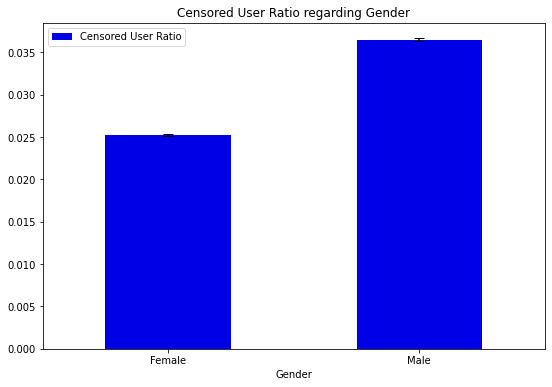

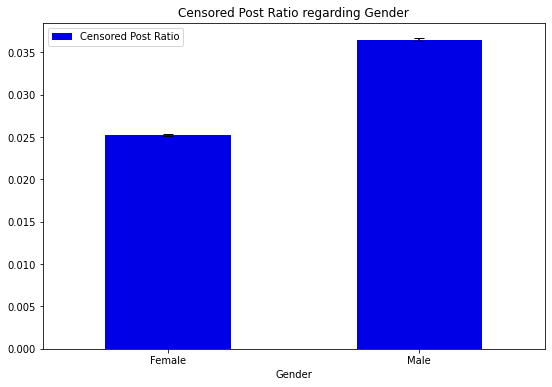

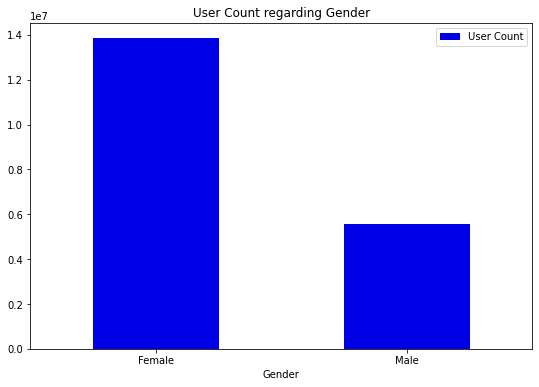

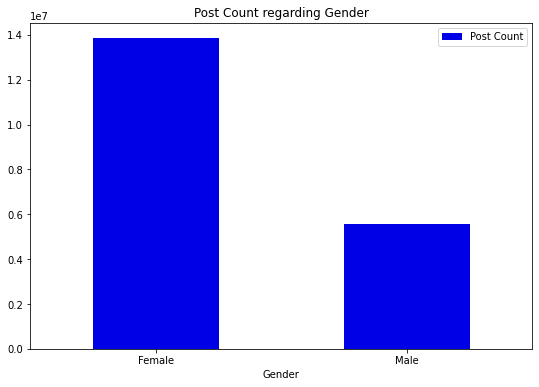

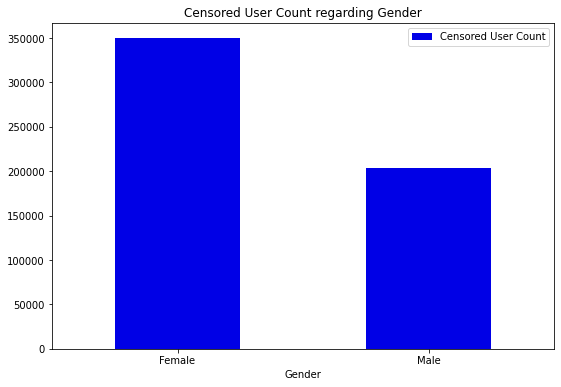

...

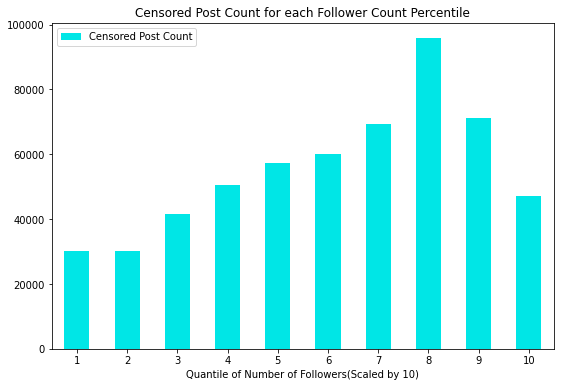

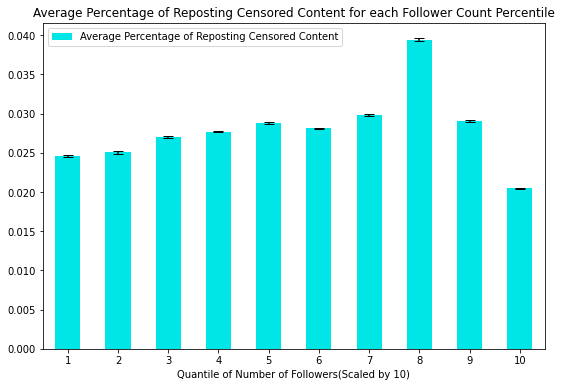

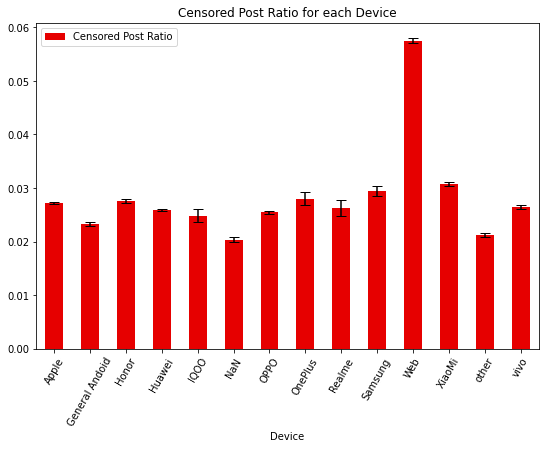

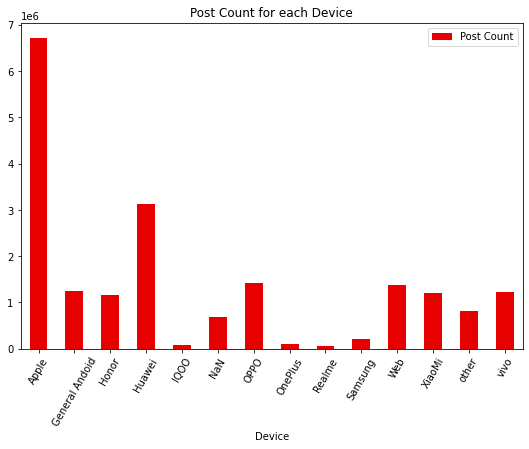

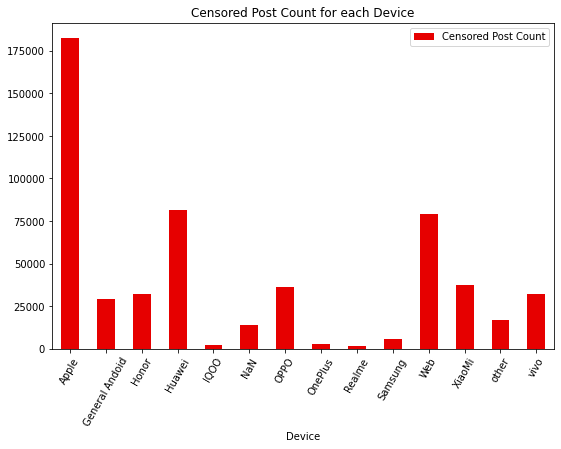

In [33]:
plt.rcParams.update({'figure.max_open_warning': 0}) # Suppress max plot num open warning
for groupby_col in columns:
    for analysis in metrics:
        for df_title, df in all_dfs.items():
            if df_title in groupby_col.applicable_dfs and df_title in analysis.applicable_dfs:
                analyze(post_df, analysis, groupby_col, df_title)

<a name="double-groupby-analysis" />

### Double Group-by Column Batch Analysis

In [34]:
def nested_column_analyze(df, analysis, col1, col2, df_title):

    # Ensures that number of groups in col1 is greater than number of groups in col2.
    if column_group_nums[col1.col_name] < column_group_nums[col2.col_name]:
        col1, col2 = col2, col1
    
    study_name = analysis.chart_analysis_name.format(df_title)

    output = pd.DataFrame({
        col1.col_name: df[col1.col_name],
        col2.col_name: df[col2.col_name],
        study_name: analysis.columns_selector(df)
    }).groupby([col1.col_name, col2.col_name]).agg(analysis.analyze_func)
    
    output.reset_index(inplace=True)
    if col1.post_process_mapping is not None or col2.post_process_mapping is not None:
        if col1.post_process_mapping is not None:
            output[col1.col_name] = output[col1.col_name].map(col1.post_process_mapping)
        if col2.post_process_mapping is not None:
            output[col2.col_name] = output[col2.col_name].map(col2.post_process_mapping)

    output = output.pivot(col1.col_name, col2.col_name)
    output.columns = [f"{study_name} for {col2name}" for study_name, col2name in output.columns]
    
    plot(output, 
         'bar', 
         title = f"{study_name} for each {col1.chart_name} and {col2.chart_name}",
         color = None
        )

# nested_column_analyze(users_with_content, metrics[0], columns[4], columns[2], "User")

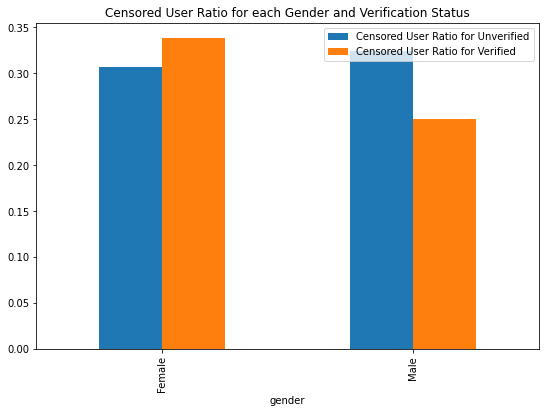

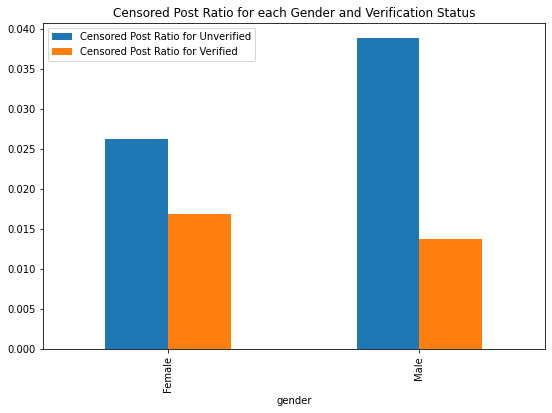

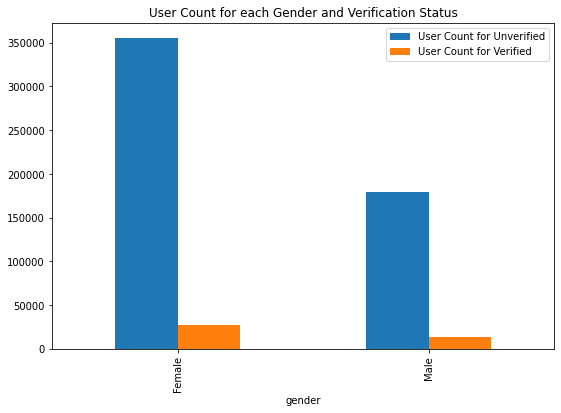

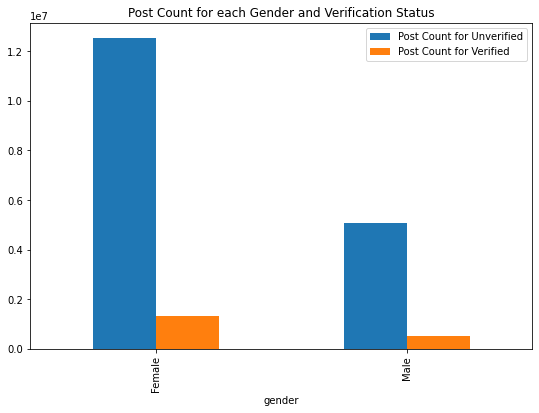

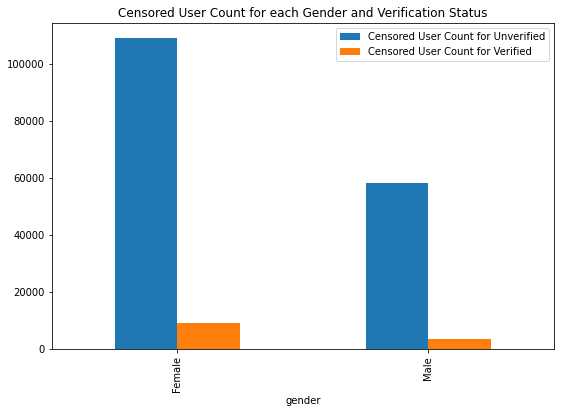

...

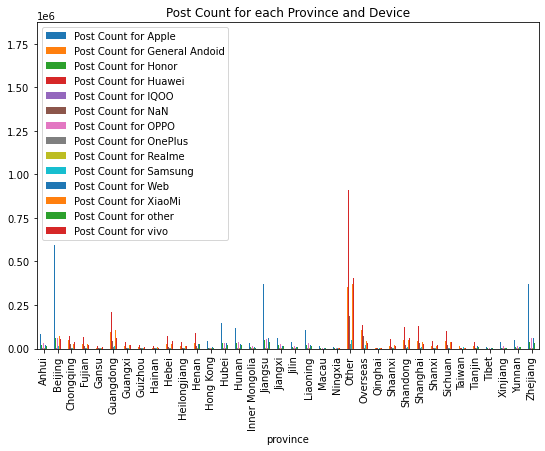

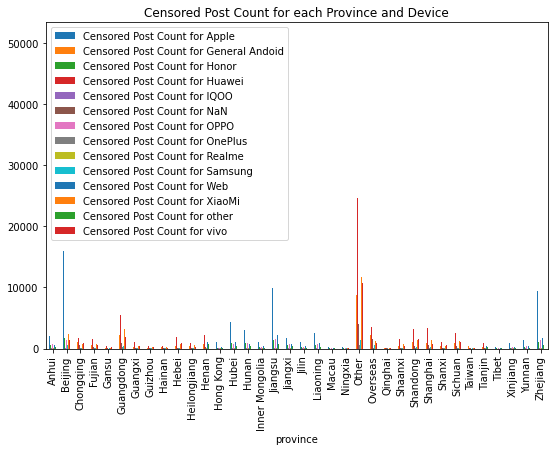

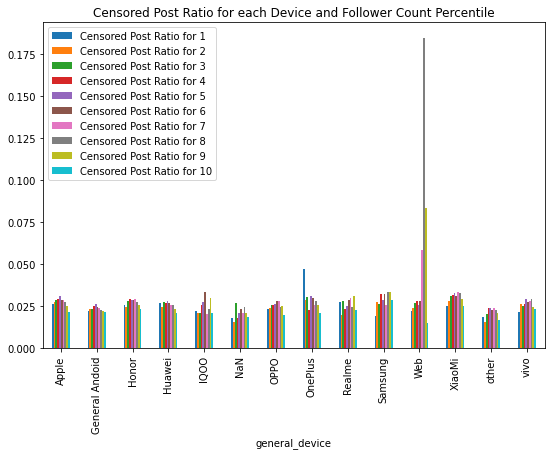

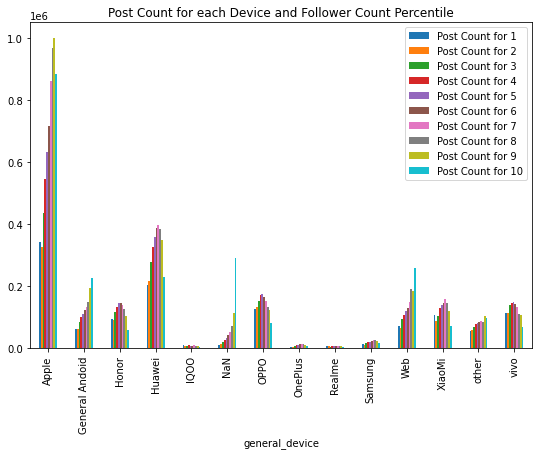

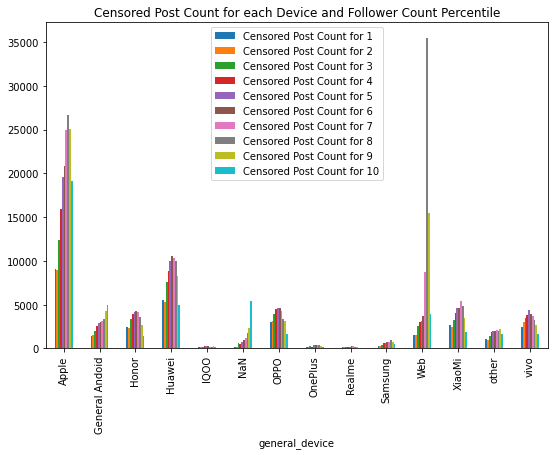

In [58]:
plt.rcParams.update({'figure.max_open_warning': 0}) # Suppress max plot num open warning

for i, groupby_col1 in enumerate(columns):
    if groupby_col1.col_name is None:
        continue
    for j, groupby_col2 in enumerate(columns[i+1:],i+1):
        if groupby_col1.col_name == groupby_col2.col_name:
            continue
        for analysis in metrics:
            for df_title, df in all_dfs.items():
                if all(
                    (df_title in dfs_list for dfs_list in [
                        groupby_col1.applicable_dfs, groupby_col2.applicable_dfs, analysis.applicable_dfs
                ])):
                    nested_column_analyze(df, analysis, groupby_col1, groupby_col2, df_title)

<a name="word-cloud"/>

# Word Cloud

## Topic Extraction -makeup

In [4]:
from google.cloud import translate_v2 as translate
import os
os.environ["GOOGLE_APPLICATION_CREDENTIALS"]="translator-47347b8d079f.json"
translate_client = translate.Client()
print(type(translate_client))


<class 'google.cloud.translate_v2.client.Client'>


## A module to take a peek at the topics in a certain area

In [5]:
my_file = open('complete_stop_words.txt',encoding="utf8")
stop_words = my_file.read().splitlines()

def cut_words_with_pos(text):
    seg = jieba.posseg.cut(text)
    res = []
    for word, flag in seg:
        if flag in ["a", "v", "x", "n", "an", "vn", "nz", "nt", "nr", "ns", "nw", "eng"] and (word not in stop_words):
            res.append(word)
    return list(res)

def corpus_generation(df):
    corpus = np.array(df['repost_weibo_comment'])
    corpus = corpus[~pd.isnull(corpus)]
    corpus = [str(i) for i in corpus]
    # segregate comments from multiple reposters
    corpus_segregated = []
    for i in corpus:
        split_repost = re.findall(r'(?<=//@).+?(?=/|$)',i)
        if split_repost:
            corpus_segregated += [i[i.find(':')+1:] for i in split_repost]
        else:
            corpus_segregated.append(i)
    # further clean the corpus_segragated
    corpus_segregated = [i for i in corpus_segregated if i] #get rid of empty strings
    corpus_segregated = [i for i in corpus_segregated if i != '转发微博' and i != 'repost' and i != '轉發微博' and i != 'Repost'] #take out default wordings
    # take the non-chinese, non-english and non-numeric characters out of the corpus while keeping some normal punctuation marks
    pattern = re.compile(r'[^\u4e00-\u9fa5^a-z^A-Z^0-9\u3002\uff1b\uff0c\uff1a\u201c\u201d\uff08\uff09\u3001\uff1f\u300a\u300b]')
    corpus_segregated = list(map(lambda x: re.sub(pattern,'',x), corpus_segregated))
    corpus_segregated = [i for i in corpus_segregated if i]
    corpus_flat_refiend = []
    for sentence in corpus_segregated:
        corpus_flat_refiend += cut_words_with_pos(sentence)
    # take the frequency of each word
    frequency_dict = {key:0 for key in set(corpus_flat_refiend)}
    for i in corpus_flat_refiend:
        frequency_dict[i] += 1
    ranked_frequency_dict = {k: v for k, v in sorted(frequency_dict.items(), key=lambda item: item[1], reverse=True)}
    translated_frequency_dict = {}
    for key,value in list(ranked_frequency_dict.items())[:1000]:
        translated_key = translate_client.translate(key, target_language='en')['translatedText']
        translated_frequency_dict[translated_key] = value
    #translated_frequency_dict['Louis Vuitton']= translated_frequency_dict.pop('Easy Vuitton')
    # to decompose each sentence into key words refined by jieba
    sentences = []
    for i in corpus_segregated:
        sentences.append(cut_words_with_pos(i))
    # bag of words model
    dictionary = corpora.Dictionary(sentences)
    corpus_topic = [dictionary.doc2bow(sentence) for sentence in sentences]

    return sentences, dictionary, corpus_topic, frequency_dict, translated_frequency_dict

def compute_coherence_values(dictionary, corpus, sentences, figure:bool, title:str):
    """
    Compute u_mass coherence for various number of topics

    Parameters:
    ----------
    dictionary : Gensim dictionary
    corpus : Gensim corpus
    texts : List of input texts
    limit : Max num of topics

    Returns:
    -------
    model_list : List of LDA topic models
    coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    """
    coherence_values = []
    model_list = []
    for num_topics in tqdm(range(3,15),position=0):
        model = gensim.models.ldamodel.LdaModel(corpus=corpus, id2word=dictionary,num_topics=num_topics)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model,texts=sentences, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())
    if figure:
        plt.plot(range(3,15), coherence_values, label='coherence score(c_v)')
        plt.title('Coherence Score')
        plt.xlabel('Number of Topics')
        plt.ylabel('Coherence Score(C_V)')
        plt.legend(loc='upper right')
        plt.savefig('./figures/%s_coherence_score_c_v.png' %title)
    return model_list, coherence_values

# take topics to dictionary
def convert_to_dict(topic: str):
    frequency_dict = {}
    for i in [i.split('*') for i in topic.split('+')]:
        frequency_dict[i[1].strip().replace('"','')] = float(i[0]) 
    return frequency_dict

# take topics to a translated dictionary
def convert_to_dict_trans(topic: str):
    frequency_dict = {}
    for i in [i.split('*') for i in topic.split('+')]:
        frequency_dict[translate_client.translate(i[1].strip().replace('"',''), target_language='en')['translatedText']] = float(i[0]) 
    return frequency_dict

# draw a word cloud for each sub-topic
def cloud_each_topic(topics:list,model_name:str,trans:bool):
    freq_dict_list = []
    for i in range(len(topics)):
        topic_words = topics[i]
        if trans:
            freq_dict = convert_to_dict_trans(topic_words)
        else:
            freq_dict = convert_to_dict(topic_words)
        freq_dict_list.append(freq_dict.copy())
        for key, values in freq_dict.items():
            freq_dict[key] = values * 1e3
        draw_cloud(freq_dict,1,'%s_%d' %(model_name,i))
    return freq_dict_list

def my_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return choice(["rgb(94,38,18)", "rgb(41,36,33)", "rgb(128,128,105)", "rgb(112,128,105)"])

def draw_cloud(word_freq,tp:0, name_file:str): #tp = 0 means general, tp = 1 means the plot for each subtopic
    if tp == 0:
        width = 800
        height = 400
    else:
        width = 400
        height = 200
    wc = WordCloud(font_path='HuaWenHeiTi-1.ttf',  # 设置字体
                   background_color="white",  # 背景颜色
                   max_words=300,  # 词云显示的最大词数
                   max_font_size=80,  # 字体最大值
                   random_state=42,
                   width = width,
                   height = height)
    
    wc.generate_from_frequencies(word_freq)

    plt.figure(figsize=(10,5))
    plt.imshow(wc.recolor(color_func=my_color_func), interpolation='bilinear')
    plt.axis("off")
    plt.show()
    wc.to_file('./figures/%s.png' %name_file)        

    
'''
for this function, parameters:
    {province, 
    post_censored, 
    censored_ratio_percentile,
    year_month, 
    gender, 
    verification, 
    general_device, 
    #follower_percentile_grouped}

we also assume that year and month appear simultaneously

'''    
def main(**kwargs):
    list_df = []
    for i in tqdm(range(12)):
        with open('./df/final_post_full%d.pkl' %i, 'rb') as f:
            df_w_post = pickle.load(f)
            condition_recorder = []
            for key, value in kwargs.items():
                if key != 'year_month':
                    condition_recorder.append(df_w_post[key] == value)
                else:
                    input_time = datetime.strptime('%s-%s' %(kwargs['year'], kwargs['month']), '%Y-%m').strftime('%Y-%m')
                    if kwargs['post_censored']:    
                        condition_recorder.append(df_w_post['repost_timestamp_month']==input_time)
                    else:
                        condition_recorder.append(df_w_post['post_timestamp_month']==input_time) 
            final_condition = reduce(lambda a,b: a&b, condition_recorder)
            # to save memory
            list_df.append(df_w_post[final_condition][['repost_weibo_comment']])
            
    df_repost = pd.concat(list_df)
    # corpus generation needs a df with comment column included
    sentences, dictionary, corpus, frequency_dict, translated_frequency_dict = corpus_generation(df_repost)
    # plot the general wc
    print('general plotting...')
    draw_cloud(frequency_dict,0,'general_wc_%s' %("_".join(map(str,kwargs.values()))))
    draw_cloud(translated_frequency_dict,0,'translated_general_wc_%s' %("_".join(map(str,kwargs.values()))))
    # find the best topics
    models, coherence_values = compute_coherence_values(dictionary,corpus,sentences,True,"_".join(map(str,kwargs.values())))
    best_model = models[coherence_values.index(max(coherence_values))]
    topics_best = []
    for topic in best_model.print_topics(num_topics=coherence_values.index(max(coherence_values))+3, num_words=20):
        topics_best.append(topic[1])
    print('topic plotting...')
    # best model to word cloud
    freq_dict = cloud_each_topic(topics_best,'best_model_%s' %("_".join(map(str,kwargs.values()))),False)
    freq_dict_trans = cloud_each_topic(topics_best,'best_model_trans_%s' %("_".join(map(str,kwargs.values()))),True)
    return df_repost,freq_dict,freq_dict_trans,topics_best

100%|███████████████████████████████████████████| 12/12 [00:14<00:00,  1.18s/it]
Building prefix dict from the default dictionary ...
Loading model from cache /tmp/jieba.cache
Loading model cost 0.353 seconds.
Prefix dict has been built successfully.


general plotting...


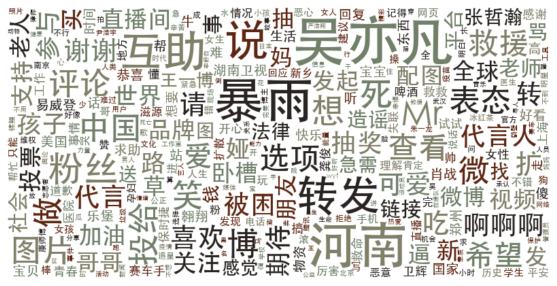

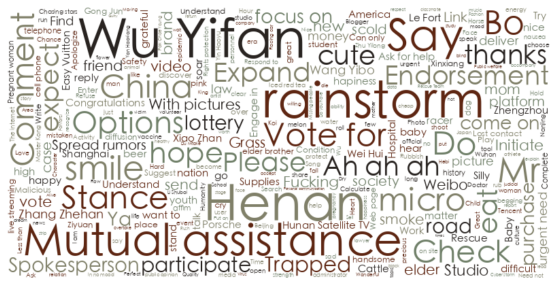

100%|███████████████████████████████████████████| 12/12 [00:23<00:00,  1.97s/it]

topic plotting...


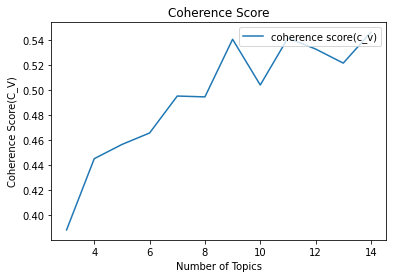

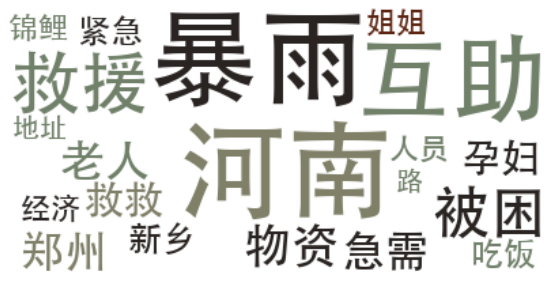

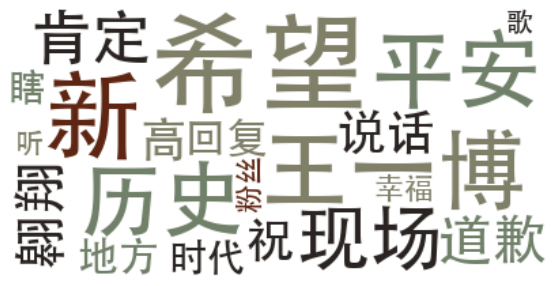

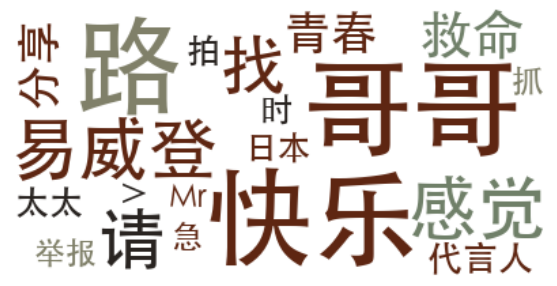

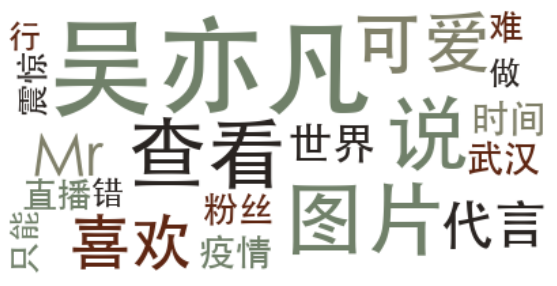

...

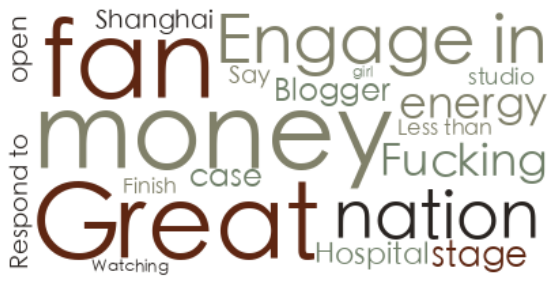

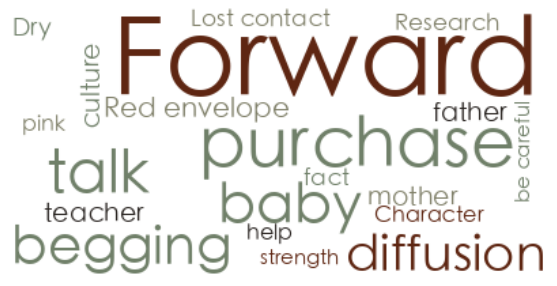

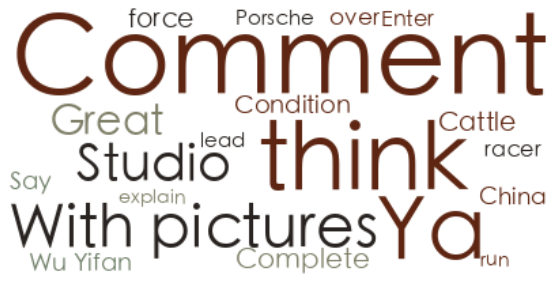

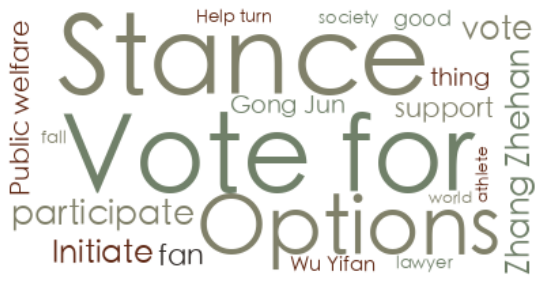

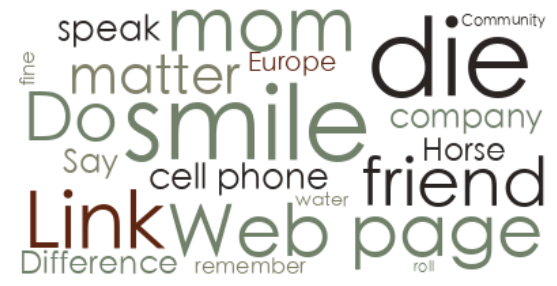

In [6]:
# testing cell
df_sh, freq_dict_sh, freq_sh_trans, topics_best = main(post_censored=True,province='上海')

In [8]:
freq_dict_sh

[{'博': 57.0,
  '微': 53.0,
  '抽奖': 39.0,
  '平台': 22.0,
  '转发': 20.0,
  '恭喜': 16.0,
  '吴亦凡': 14.0,
  '全': 13.0,
  '工具': 11.0,
  '蹭': 11.0,
  '不行': 10.0,
  '扩散': 10.0,
  '官方': 9.0,
  '进': 9.0,
  '用户': 9.0,
  '公正': 9.0,
  '名': 9.0,
  '帮忙': 8.0,
  '事': 8.0,
  'Mr': 8.0},
 {'喜欢': 47.0,
  '链接': 43.0,
  '网页': 35.0,
  '郑州': 21.0,
  '牛': 19.0,
  '医院': 19.0,
  '逼': 17.0,
  '博主': 16.0,
  '妈妈': 12.0,
  '动物': 11.0,
  '王': 11.0,
  '宝宝': 11.0,
  '水': 11.0,
  '低': 10.0,
  '好人': 10.0,
  '保佑': 9.0,
  '羡慕': 9.0,
  '帮帮': 9.0,
  '原': 7.0,
  '情侣': 7.0},
 {'加油': 35.0,
  '物资': 28.0,
  '感觉': 26.0,
  '平安': 23.0,
  '开心': 22.0,
  '想要': 20.0,
  '玩': 15.0,
  '希望': 15.0,
  '感谢': 14.0,
  '青春': 13.0,
  '追星': 13.0,
  '红包': 12.0,
  '分享': 10.0,
  '乐堡': 9.0,
  '想': 9.0,
  '发现': 9.0,
  '宝': 9.0,
  '说': 9.0,
  '啤酒': 9.0,
  '好像': 8.0},
 {'图片': 70.0,
  '查看': 66.0,
  '可爱': 56.0,
  '东西': 19.0,
  '历史': 17.0,
  '厉害': 17.0,
  '能量': 16.0,
  '高': 14.0,
  '吃': 12.0,
  '帮转': 11.0,
  '日本': 10.0,
  '运动员': 9.0,
  '举报': 8.0,
  '动': 8.0,
  

In [8]:
freq_sh_trans

{'Forward': 82.0,
 'expect': 36.0,
 'Spokesperson': 29.0,
 'brand': 28.0,
 'mom': 27.0,
 'Supplies': 26.0,
 'road': 24.0,
 'worldwide': 22.0,
 'Safety': 19.0,
 'thing': 16.0,
 'Wu Yifan': 15.0,
 'Try': 14.0,
 'Xiao Zhan': 14.0,
 'nice': 12.0,
 'live': 12.0,
 'Help': 11.0,
 'Easy Vuitton': 10.0,
 'help': 10.0,
 'over': 10.0,
 'information': 9.0}

100%|███████████████████████████████████████████| 12/12 [00:15<00:00,  1.27s/it]
Building prefix dict from the default dictionary ...
Dumping model to file cache /tmp/jieba.cache
Loading model cost 0.319 seconds.
Prefix dict has been built successfully.


general plotting...


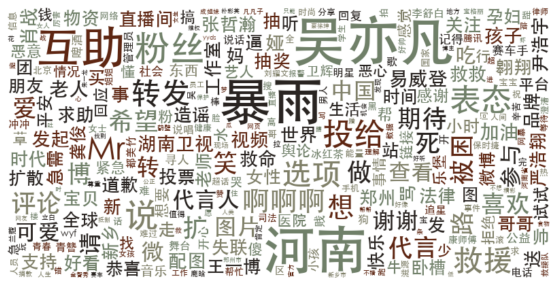

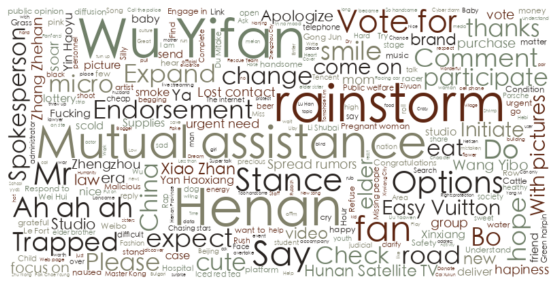

100%|███████████████████████████████████████████| 12/12 [03:25<00:00, 17.14s/it]

topic plotting...


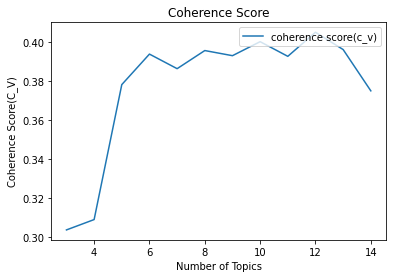

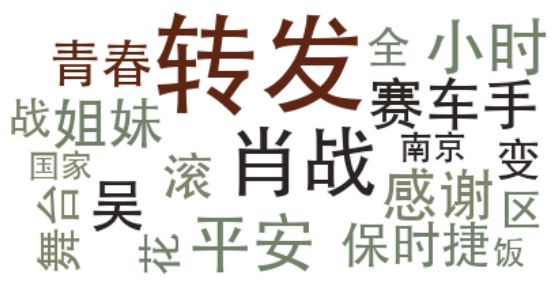

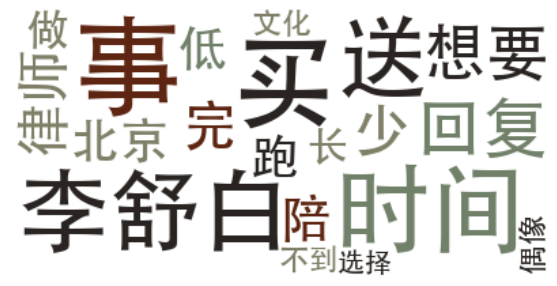

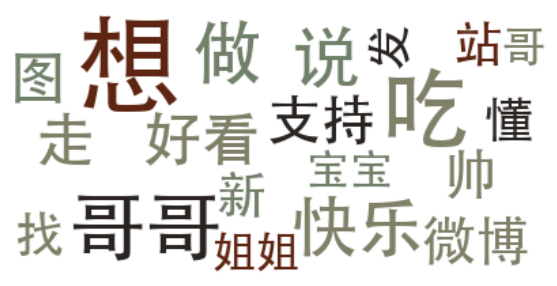

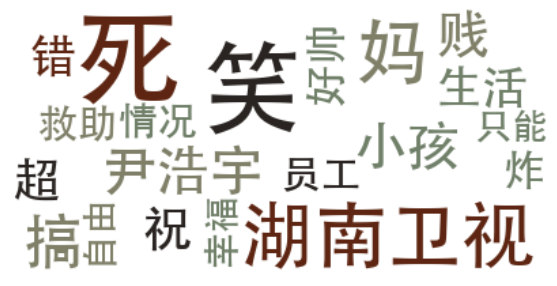

...

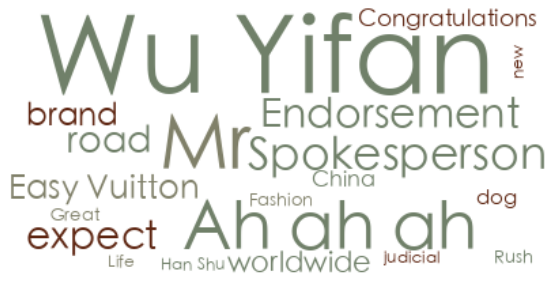

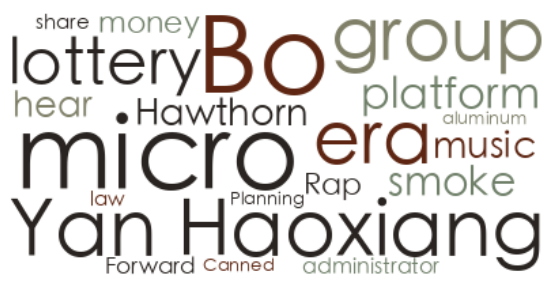

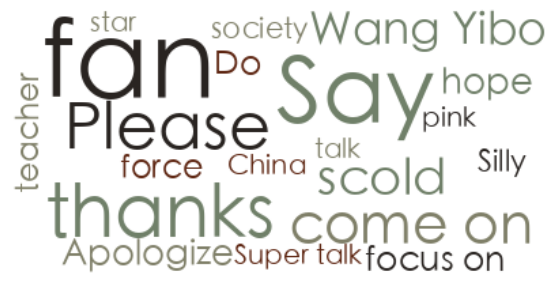

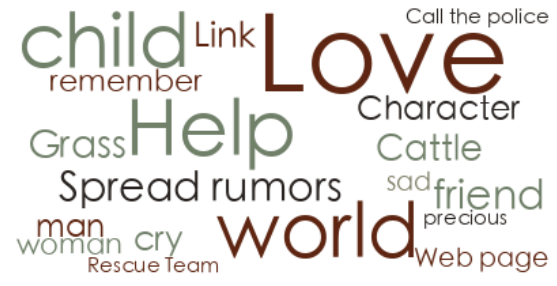

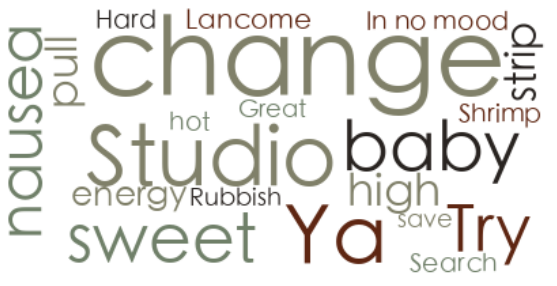

In [10]:
# gender is male
main(post_censored=True, gender='f')

100%|███████████████████████████████████████████| 12/12 [00:15<00:00,  1.33s/it]
Building prefix dict from the default dictionary ...
Dumping model to file cache /tmp/jieba.cache
Loading model cost 0.321 seconds.
Prefix dict has been built successfully.


general plotting...


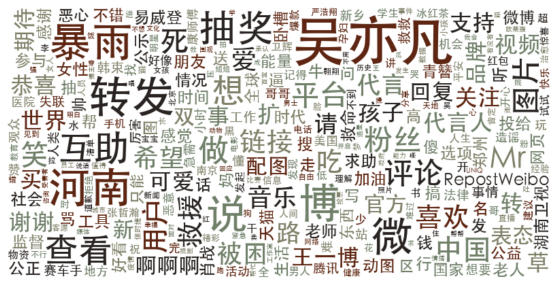

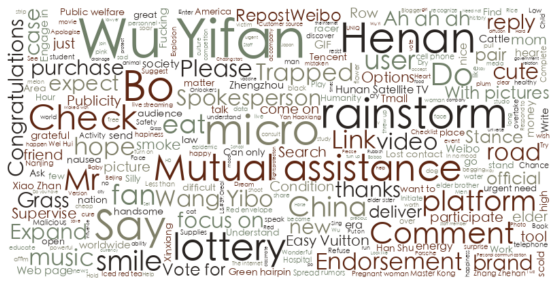

100%|███████████████████████████████████████████| 12/12 [00:33<00:00,  2.79s/it]

topic plotting...


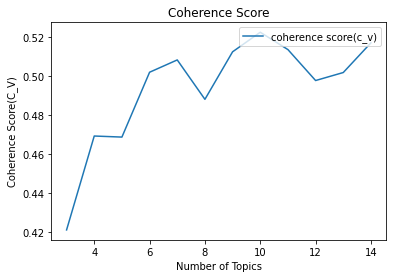

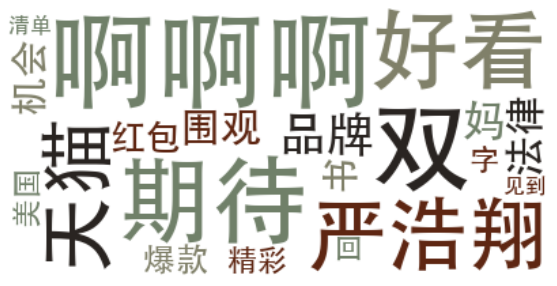

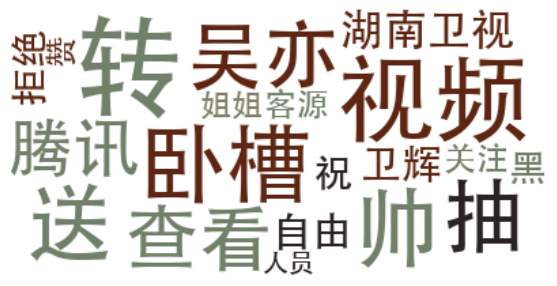

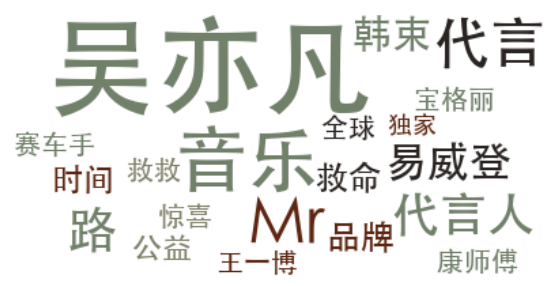

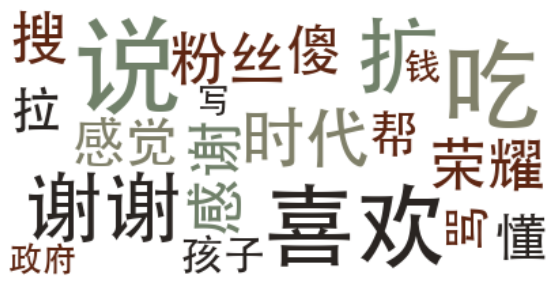

...

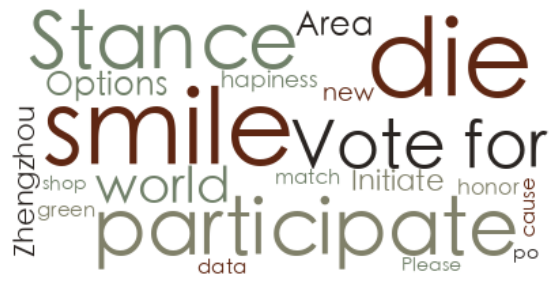

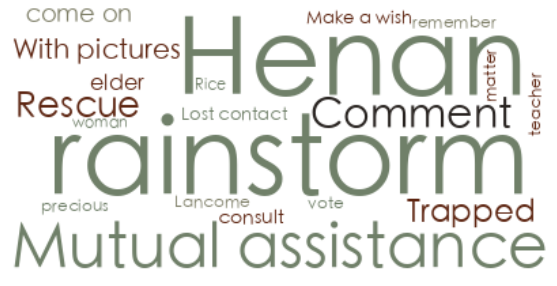

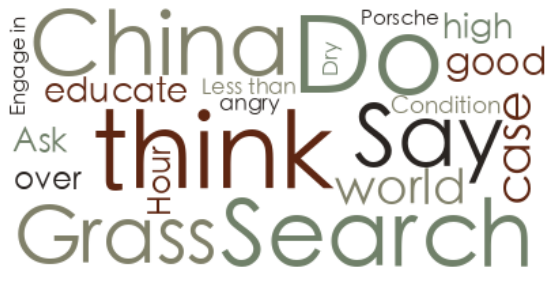

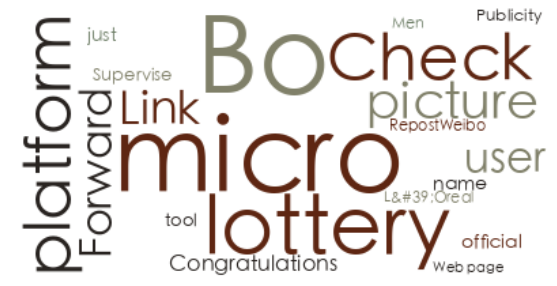

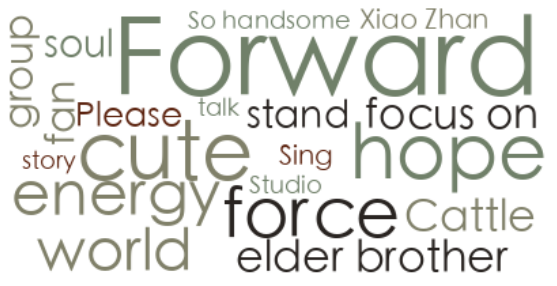

In [8]:
# device is web
df = main(post_censored=True,general_device='Web')

In [ ]:
main(post_censored=True,province='西藏')

In [7]:
post_df['general_device'].unique()

<StringArray>
[         'Apple',          'other',           'vivo',            'Web',
          'Honor', 'General Andoid',           'OPPO',        'Samsung',
         'XiaoMi',         'Huawei',        'OnePlus',            'NaN',
         'Realme',           'IQOO']
Length: 14, dtype: string

<a name="validation"/>

# Validation

In [10]:
validation_df = pd.read_csv('/home/sean/Desktop/CSC440_project/data_general/verification_locations_combined.csv', names=['id','location'])

In [12]:
validation_df['location'] = validation_df['location'].map(lambda x: x.split(' ')[0])

In [38]:
validation_user

,location,count,ratio
0,上海,1302,0.023298
1,云南,620,0.011094
2,其他,25231,0.451481
3,内蒙古,300,0.005368
4,北京,2634,0.047133
5,台湾,173,0.003096
6,吉林,369,0.006603
7,四川,1369,0.024497
8,天津,391,0.006997
9,宁夏,95,0.001700


Text(0.5, 1.0, 'Validation Data Set Distribution')

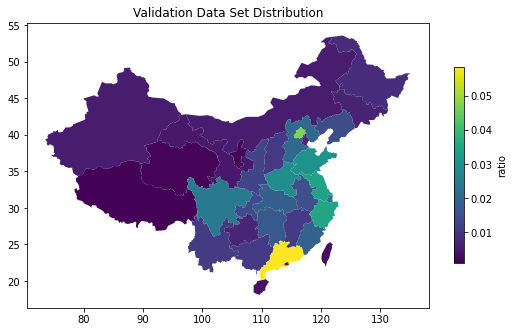

In [45]:
validation_user = pd.DataFrame(validation_df.groupby('location').size()).reset_index(drop=False).rename(columns={0:'count'})
validation_user['ratio'] = validation_user['count'].map(lambda x: x / np.sum(validation_user['count']))
validation_user.sort_values(by = 'ratio')

kwargs = {}
validation_map = china_geo_df.merge(validation_user, left_on='name', right_on=validation_user.columns[0])
kwargs.setdefault('figsize', (9,6))
kwargs.setdefault('legend', True)
kwargs.setdefault('legend_kwds',{'label': 'ratio','shrink': 0.6})
ax = validation_map.plot(column='ratio', **kwargs)
ax.set_title('Validation Data Set Distribution')

Text(0.5, 1.0, 'Collected User Distribution')

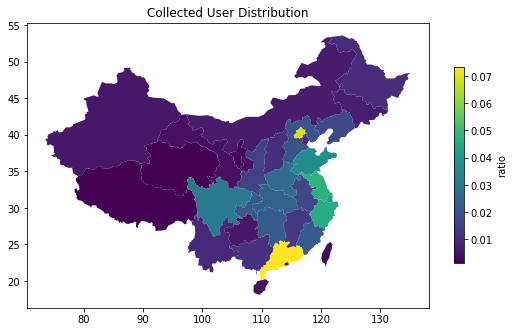

In [44]:
user_with_ratio = pd.DataFrame(users_with_content.groupby(['province']).size()).reset_index(drop=False).rename(columns={0:'count'})
user_with_ratio['ratio'] = user_with_ratio['count'].map(lambda x: x / np.sum(user_with_ratio['count']))
user_with_ratio.sort_values(by = 'ratio')

kwargs = {}
distribution_map = china_geo_df.merge(user_with_ratio, left_on='name', right_on=user_with_ratio.columns[0])
kwargs.setdefault('figsize', (9,6))
kwargs.setdefault('legend', True)
kwargs.setdefault('legend_kwds',{'label': 'ratio','shrink': 0.6})
ax = distribution_map.plot(column='ratio', **kwargs)
ax.set_title('Collected User Distribution')

<AxesSubplot:xlabel='censored_ratio', ylabel='Density'>

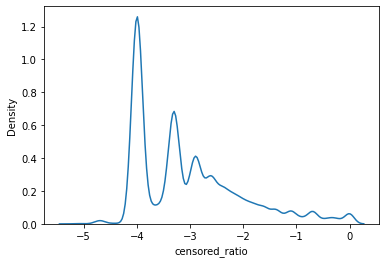

In [53]:
import seaborn as sns
k = users_with_content[users_with_content['censored']==True]['censored_ratio']
k = np.log(k)
sns.kdeplot(data = k)

<a name="Features"/>

# Regression/Feature importance

<a name="xgboost" />

### Decision-Tree based feature extraction

In [4]:
province_translations = {
    "安徽":"Anhui",
    "福建":"Fujian",
    "甘肃":"Gansu",
    "广东":"Guangdong",
    "贵州":"Guizhou",
    "海南":"Hainan",
    "河北":"Hebei",
    "黑龙江":"Heilongjiang",
    "河南":"Henan",
    "湖北":"Hubei",
    "湖南":"Hunan",
    "江苏":"Jiangsu",
    "江西":"Jiangxi",
    "吉林":"Jilin",
    "辽宁":"Liaoning",
    "青海":"Qinghai",
    "陕西":"Shaanxi",
    "山东":"Shandong",
    "山西":"Shanxi",
    "四川":"Sichuan",
    "云南":"Yunnan",
    "浙江":"Zhejiang",
    "北京":"Beijing",
    "重庆":"Chongqing",
    "上海":"Shanghai",
    "天津":"Tianjin",
    "广西":"Guangxi",
    "内蒙古":"Inner Mongolia",
    "宁夏":"Ningxia",
    "新疆":"Xinjiang",
    "西藏":"Tibet",
    "香港":"Hong Kong",
    "澳门":"Macau",
    "台湾":"Taiwan",
    "海外":"Overseas",
    "其他":"Other",
}

In [5]:
post_df['province_trans'] = post_df['province'].map(lambda x: province_translations[x])

In [6]:
post_df.columns

Index(['user_id', 'general_device', 'repost_timestamp_month',
       'post_timestamp_month', 'post_censored', 'gender', '#tweets',
       '#follower', '#following', 'verification', '#censored_posts',
       '#collected_posts', '#follower_percentile_grouped', 'province',
       'province_gdp', 'censored', 'censored_ratio',
       'censored_ratio_percentile', 'province_trans'],
      dtype='object')

In [7]:
post_df_features = post_df.drop(columns=['user_id','#censored_posts','#collected_posts','repost_timestamp_month','post_timestamp_month','#follower_percentile_grouped','censored','province','censored_ratio_percentile','censored_ratio'])

In [8]:
post_df_features

,general_device,post_censored,gender,#tweets,#follower,#following,verification,province_gdp,province_trans
0,Apple,False,f,138,7,521,False,0,Other
1,Apple,False,f,138,7,521,False,0,Other
2,Apple,False,f,138,7,521,False,0,Other
3,Apple,False,f,138,7,521,False,0,Other
4,Apple,False,f,138,7,521,False,0,Other
...,...,...,...,...,...,...,...,...,...
47,other,False,f,1782,332,676,False,0,Other
48,other,False,f,1782,332,676,False,0,Other
49,other,False,f,1782,332,676,False,0,Other
50,other,False,f,1782,332,676,False,0,Other


In [9]:
post_df_features[post_df_features['post_censored']==True]

,general_device,post_censored,gender,#tweets,#follower,#following,verification,province_gdp,province_trans
20,Honor,True,m,551,208,317,False,8302,Henan
24,Honor,True,m,551,208,317,False,8302,Henan
73,Honor,True,m,551,208,317,False,8302,Henan
77,Honor,True,m,551,208,317,False,8302,Henan
10,Apple,True,m,5542,198507,141,True,0,Overseas
...,...,...,...,...,...,...,...,...,...
34,XiaoMi,True,f,116,8,113,False,0,Other
4,OPPO,True,f,612,134,159,False,6797,Hebei
4,OnePlus,True,f,1782,332,676,False,0,Other
6,OnePlus,True,f,1782,332,676,False,0,Other


In [ ]:
# to balance the data

In [10]:
X = post_df_features.drop(columns='post_censored').reset_index(drop=True)
y = post_df_features['post_censored'].reset_index(drop=True)
cat_list = [
    'general_device',
    'gender',
    'verification',
    'province_trans'
]
X_cat = pd.get_dummies(X[cat_list],columns=cat_list,prefix_sep='_')
X_num = X.drop(columns=cat_list)
X = pd.concat([X_cat, X_num], axis = 1)

In [104]:
X

,general_device_Apple,general_device_General Andoid,general_device_Honor,general_device_Huawei,general_device_IQOO,general_device_NaN,general_device_OPPO,general_device_OnePlus,general_device_Realme,general_device_Samsung,...,province_trans_Taiwan,province_trans_Tianjin,province_trans_Tibet,province_trans_Xinjiang,province_trans_Yunnan,province_trans_Zhejiang,#tweets,#follower,#following,province_gdp
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,138,7,521,0
1,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,138,7,521,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,138,7,521,0
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,138,7,521,0
4,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,138,7,521,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19428132,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1782,332,676,0
19428133,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1782,332,676,0
19428134,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1782,332,676,0
19428135,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1782,332,676,0


In [11]:
from sklearn.utils import shuffle
y_loc_train_t = np.array(random.sample(list(y[y==True].index), k=400000))
y_loc_test_t = np.array(list((set(y[y==True].index) - set(y_loc_train_t))))
y_loc_train_f = np.array(random.sample(list(y[y==False].index), k=800000))
y_loc_test_f = np.array(random.sample(list(set(y[y==False].index) - set(y_loc_train_f)), k=300000))
y_train_loc = np.concatenate((y_loc_train_f,y_loc_train_t))
y_test_loc = np.concatenate((y_loc_test_f,y_loc_test_t))
X_train = shuffle(X.iloc[y_train_loc], random_state=99)
y_train = shuffle(y.iloc[y_train_loc].astype('int'), random_state=99)
X_test = shuffle(X.iloc[y_test_loc], random_state=99)
y_test = shuffle(y.iloc[y_test_loc].astype('int'), random_state=99)


In [18]:
from xgboost import XGBClassifier
param_dict = {
    'objective':'binary:logistic',
    'verbosity': 1,
    'n_estimators':400,
    'nthread': 6,
    'eta': 0.02,
    'use_label_encoder': False
    } 
model = XGBClassifier(**param_dict)
model.fit(X_train,y_train, eval_set=[(X_train, y_train), (X_test, y_test)],eval_metric='auc',verbose=True)

[0]	validation_0-auc:0.61211	validation_1-auc:0.61175
[1]	validation_0-auc:0.61310	validation_1-auc:0.61277
[2]	validation_0-auc:0.61314	validation_1-auc:0.61283
[3]	validation_0-auc:0.61347	validation_1-auc:0.61301
[4]	validation_0-auc:0.61509	validation_1-auc:0.61455
[5]	validation_0-auc:0.61518	validation_1-auc:0.61456
[6]	validation_0-auc:0.61545	validation_1-auc:0.61480
[7]	validation_0-auc:0.61551	validation_1-auc:0.61481
[8]	validation_0-auc:0.61566	validation_1-auc:0.61496
[9]	validation_0-auc:0.61569	validation_1-auc:0.61503
[10]	validation_0-auc:0.61571	validation_1-auc:0.61508
[11]	validation_0-auc:0.61592	validation_1-auc:0.61525
[12]	validation_0-auc:0.61613	validation_1-auc:0.61545
[13]	validation_0-auc:0.61620	validation_1-auc:0.61554
[14]	validation_0-auc:0.61626	validation_1-auc:0.61560
[15]	validation_0-auc:0.61640	validation_1-auc:0.61575
[16]	validation_0-auc:0.61663	validation_1-auc:0.61594
[17]	validation_0-auc:0.61664	validation_1-auc:0.61595
[18]	validation_0-au

[149]	validation_0-auc:0.62953	validation_1-auc:0.62804
[150]	validation_0-auc:0.62965	validation_1-auc:0.62815
[151]	validation_0-auc:0.62974	validation_1-auc:0.62823
[152]	validation_0-auc:0.62987	validation_1-auc:0.62835
[153]	validation_0-auc:0.63001	validation_1-auc:0.62846
[154]	validation_0-auc:0.63008	validation_1-auc:0.62852
[155]	validation_0-auc:0.63018	validation_1-auc:0.62861
[156]	validation_0-auc:0.63029	validation_1-auc:0.62872
[157]	validation_0-auc:0.63039	validation_1-auc:0.62882
[158]	validation_0-auc:0.63050	validation_1-auc:0.62891
[159]	validation_0-auc:0.63059	validation_1-auc:0.62899
[160]	validation_0-auc:0.63068	validation_1-auc:0.62906
[161]	validation_0-auc:0.63075	validation_1-auc:0.62912
[162]	validation_0-auc:0.63082	validation_1-auc:0.62918
[163]	validation_0-auc:0.63089	validation_1-auc:0.62922
[164]	validation_0-auc:0.63098	validation_1-auc:0.62931
[165]	validation_0-auc:0.63110	validation_1-auc:0.62940
[166]	validation_0-auc:0.63115	validation_1-auc:

[296]	validation_0-auc:0.63995	validation_1-auc:0.63638
[297]	validation_0-auc:0.63997	validation_1-auc:0.63639
[298]	validation_0-auc:0.64001	validation_1-auc:0.63642
[299]	validation_0-auc:0.64011	validation_1-auc:0.63650
[300]	validation_0-auc:0.64018	validation_1-auc:0.63655
[301]	validation_0-auc:0.64023	validation_1-auc:0.63659
[302]	validation_0-auc:0.64026	validation_1-auc:0.63661
[303]	validation_0-auc:0.64029	validation_1-auc:0.63663
[304]	validation_0-auc:0.64036	validation_1-auc:0.63668
[305]	validation_0-auc:0.64041	validation_1-auc:0.63673
[306]	validation_0-auc:0.64046	validation_1-auc:0.63675
[307]	validation_0-auc:0.64048	validation_1-auc:0.63676
[308]	validation_0-auc:0.64049	validation_1-auc:0.63677
[309]	validation_0-auc:0.64057	validation_1-auc:0.63686
[310]	validation_0-auc:0.64060	validation_1-auc:0.63689
[311]	validation_0-auc:0.64066	validation_1-auc:0.63694
[312]	validation_0-auc:0.64072	validation_1-auc:0.63698
[313]	validation_0-auc:0.64078	validation_1-auc:

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, eta=0.02, gamma=0,
              gpu_id=-1, importance_type='gain', interaction_constraints='',
              learning_rate=0.0199999996, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=400, n_jobs=6, nthread=6, num_parallel_tree=1,
              random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
              subsample=1, tree_method='exact', use_label_encoder=False,
              validate_parameters=1, verbosity=1)

In [19]:
y_ = model.predict(X_test)


In [20]:
y_

array([0, 0, 0, ..., 0, 0, 0])

In [21]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,y_)

0.6952276581060133

In [130]:
from sklearn.metrics import confusion_matrix, classification_report
confusion_matrix(y_test, y_)

array([[295924,   4076],
       [134656,  18853]])

In [131]:
print(classification_report(y_test, y_))

              precision    recall  f1-score   support

           0       0.69      0.99      0.81    300000
           1       0.82      0.12      0.21    153509

    accuracy                           0.69    453509
   macro avg       0.75      0.55      0.51    453509
weighted avg       0.73      0.69      0.61    453509



In [22]:
import shap
explainer = shap.TreeExplainer(model)


In [23]:
shap_values = explainer(X_test)

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


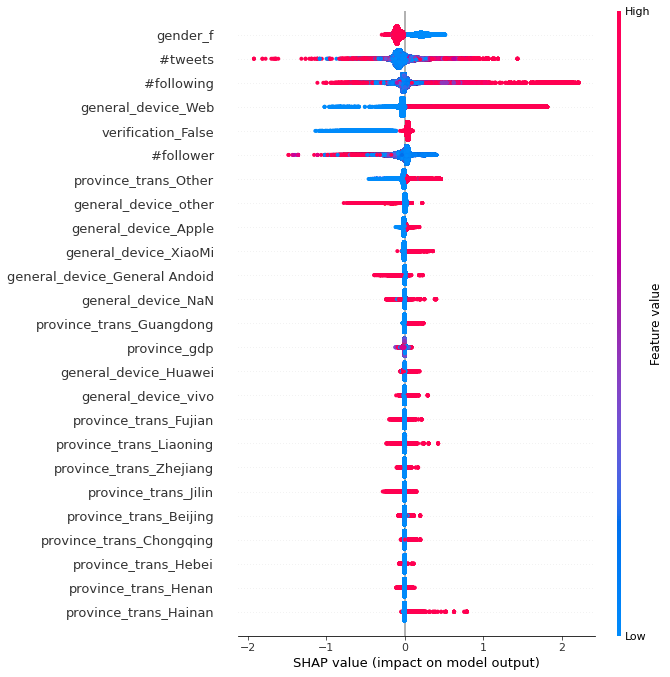

In [42]:
shap.summary_plot(shap_values, X_test, show=False)
plt.savefig("shap.png")

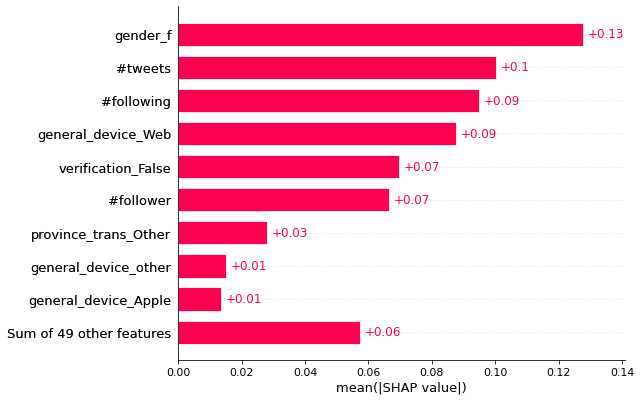

In [34]:
shap.plots.bar(shap_values)

In [44]:
shap_values[0]

.values =
array([-7.44169857e-03,  4.84863902e-03, -6.18504069e-04,  3.23196338e-03,
        2.17330773e-04,  4.15954972e-03, -5.51306075e-05,  5.05475618e-05,
       -6.23496589e-06, -3.71911337e-05,  1.43333912e-01, -7.07957428e-03,
        7.63172610e-03, -2.18688801e-04, -1.19494028e-01,  0.00000000e+00,
        4.34769429e-02,  0.00000000e+00,  5.82348803e-05, -1.04059430e-03,
       -1.15305971e-04,  1.16539630e-03, -9.87652966e-05, -3.58371553e-03,
       -1.19598499e-05, -3.19975697e-06, -2.57897569e-04,  6.50160189e-04,
        1.00595853e-03, -1.79762064e-04, -4.56422458e-05, -2.95640584e-05,
       -2.61366222e-05, -3.30518174e-04, -1.22284808e-04, -9.07289505e-05,
        1.33973977e-03,  3.83342820e-04, -2.10467097e-05, -4.71859275e-05,
       -2.90901046e-02, -1.48835665e-04, -3.43944776e-05, -9.45124775e-05,
       -3.41983759e-05,  1.62243246e-04, -7.88148100e-06,  1.94952780e-04,
        1.89419457e-04,  4.99627495e-05, -1.46668781e-05, -4.68710095e-06,
       -4.46768

In [31]:
y_probs = model.predict_proba(X_test)

Function plot_roc_curve is deprecated; This will be removed in v0.5.0. Please use scikitplot.metrics.plot_roc instead.


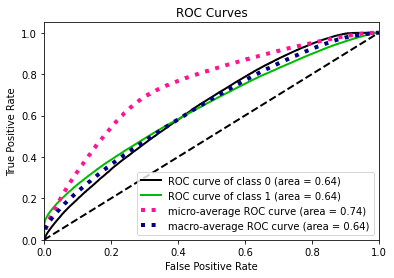

In [32]:
import scikitplot as skplt
import matplotlib.pyplot as plt
skplt.metrics.plot_roc_curve(y_test, y_probs)
#plt.savefig('auc.png')
plt.show()


In [38]:
os.getcwd()

'/home/sean/Desktop/CSC440_project/processing'

<a name="Linear-Regression" />

### Linera Regression

In [27]:
from sklearn import *
linear_reg = linear_model.LinearRegression().fit(X_train, y_train)


In [29]:
linear_reg.coef_

array([-5.23680903e-04, -2.26836234e-03, -1.46506870e-03, -2.06357908e-03,
       -5.79784820e-03, -3.79254552e-03, -1.66989366e-03, -3.17304562e-03,
       -2.64910639e-03,  2.81565799e-04,  2.88335301e-02,  1.47438148e-03,
       -6.26247968e-03, -9.23867285e-04, -3.61773363e-03,  3.61773363e-03,
        6.55896631e-03, -6.55896631e-03, -6.99435076e-04, -1.23297175e-03,
        4.18922555e-04, -2.83426698e-03,  2.11920349e-03,  5.19320940e-04,
       -3.61499841e-03,  5.59916598e-04,  9.94013534e-03, -2.43286213e-03,
       -9.27180843e-04,  5.49597066e-04,  4.44161935e-03,  9.40790005e-04,
       -4.68794403e-04,  5.05406283e-03, -4.80935903e-04,  2.58049719e-03,
       -1.89736250e-03,  2.86992414e-04, -3.23823885e-03,  1.39742828e-03,
        5.67837009e-03, -3.00188830e-03, -5.64348789e-03,  2.88848595e-03,
       -1.54007987e-03, -9.33941387e-04, -1.19725763e-03,  6.03186205e-04,
       -2.86775493e-04, -2.32635928e-03, -3.58206806e-04, -2.48927239e-03,
       -1.55298349e-03, -

In [32]:
linear_reg.score(X_test, y_test)

-0.005060904382198084

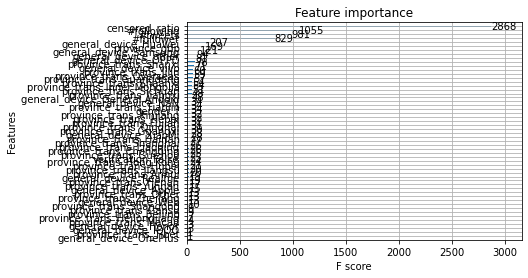

In [58]:
from xgboost import plot_importance
from matplotlib import pyplot

plot_importance(model)
pyplot.show()

In [ ]:
from sklearn.preprocessing import OneHotEncoder
cat_list = [
    'general_device',
    'gender',
    'verification',
    'province_trans'
]
x_ = OneHotEncoder().fit_transform(X[cat_list]).toarray()

In [60]:
x_

<19428137x54 sparse matrix of type '<class 'numpy.float64'>'
	with 77712548 stored elements in Compressed Sparse Row format>

In [56]:
post_df_features.dtypes.index

Index(['general_device', 'post_censored', 'gender', '#tweets', '#follower',
       '#following', 'verification', '#censored_posts', '#collected_posts',
       'province_gdp', 'censored_ratio', 'province_trans'],
      dtype='object')

In [15]:
users_with_content_feature = users_with_content.drop(columns=['id','#censored_posts','#collected_posts','#follower_percentile_grouped','censored','censored_ratio_percentile'])
users_with_content_feature

,gender,#tweets,#follower,#following,verification,province,province_gdp,censored_ratio
536321,f,2,0,172,False,其他,0,0.000000
278927,f,8,0,18,False,其他,0,0.000000
151815,m,15,0,48,False,河南,8302,0.000000
102659,m,55,0,420,False,河南,8302,0.000000
366639,m,40,0,221,False,其他,0,0.000000
...,...,...,...,...,...,...,...,...
381105,m,1146,52521601,1924,True,北京,23805,0.023256
494713,m,1210,53897766,344,True,北京,23805,0.018868
352277,f,4972,71591411,470,True,台湾,28306,0.020408
117507,m,3963,71823990,725,True,上海,23277,0.017544
